## SARSA($\lambda$)
In this section we will implement the online $Sarsa(\lambda)$ algorithm for model free control (refered to the book Introduction to Reinforcement Learning written by Sutton 1st edition, Chapter 7)

In [37]:
# Setup environment
import dill
from frozen_lake import FrozenLakeEnv
env = FrozenLakeEnv()
#Import MDP object for Frozen Lake environment
with open('FrozenLakeMDP.pkl', 'rb') as input:
  mdp = dill.load(input)
%matplotlib inline 
import numpy as np
import numpy.random as nr
import gym
import matplotlib.pyplot as plt
import matplotlib as mpl
from MDP import MDP

In [4]:
# to get the true value function from the MDP
def compute_Qmu(alpha, J_mu, mdp):
    '''
    Returns Qmu, an mdp.nS x mdp.nA array representing the Q function at
    cost vector J 
    '''
    Qmu = np.array([[sum([l[0]*(l[2] + alpha*J_mu[l[1]]) for l in mdp.P[s][a]]) for a in range(mdp.nA)] for s in range(mdp.nS)])    
    return Qmu

def value_iteration(alpha, mdp, nIt):
    J_k = np.zeros(mdp.nS)   #Initialize cost
    Js = [J_k]               #Lists to collect iterates
    mus = []
    for it in range(nIt):
        Qmu = compute_Qmu(alpha, J_k, mdp)
        J_k, mu_k =  np.max(Qmu,axis=1), np.argmax(Qmu, axis=1)
        Js.append(J_k)
        mus.append(mu_k)
    return np.array(Js), np.array(mus), Qmu
Js_VI, mus_VI, Qmu = value_iteration(1, mdp, 50)

In [5]:
# initialize the Q value matrix (16 by 4)
def SarsaLambdaETrace(mdp, nEp, nStep, epi, gamma, alpha, Lambda, stepExponent=-0.5):
    Q = np.zeros((mdp.nS, mdp.nA))
    Reward = []
    # to see values changes of a single Q[3][2]
    Qvalue = 0
    # the average rewards for every 500 episodes
    Score = 0
    RMSE = []
    Js_Q = []
    mus = []
    actions = [l for l in range(mdp.nA)]
    for ep in range(nEp):
        # adapt stepsize to get the convergent Q values
        stepSize = alpha*(ep+1)**stepExponent
        ETrace = np.zeros((mdp.nS, mdp.nA))
        RewardSum = 0
        s = 0 # Start at top-left
        a = nr.randint(0, mdp.nA) # Randomly choose an action at the beginning
        #print(a)
        for t in range(nStep):        
            # take an action to get reward and next state
            sp, r = mdp.step(s,a)
            RewardSum += r
            if nr.rand() >= epi:
                ap = np.argmax(Q[sp])
            else:
                ap = nr.choice([act for act in actions if act != np.argmax(Q[sp])])      
            # TD error
            delta = r + gamma * Q[sp][ap] - Q[s][a]
            # Eligibility trace update
            ETrace[s][a] = ETrace[s][a] + 1
            Q = Q + stepSize*delta*ETrace
            ETrace = gamma*Lambda*ETrace
            s = sp
            a = ap
            if s not in mdp.transient:
                print("Episode {} finished after {} timesteps getting {} rewards".format(ep, t+1, RewardSum))
                Reward = np.append(Reward, RewardSum)
                Qvalue = np.append(Qvalue, Q[3][2])
                J_k, mu_k = np.max(Q, axis =1), np.argmax(Q, axis = 1)
                Js_Q.append(J_k)
                mus.append(mu_k)
                RMSE.append(np.linalg.norm(Q-Qmu))
                if (ep+1)%500 == 0:
                    Score = np.append(Score, np.mean(Reward[-500:]))
                break
    return {'Score':Score, 'Qvalue':Qvalue, 'Reward': Reward, 'RMSE': RMSE, 'Js_Q': Js_Q, 'mus': mus};

In [11]:
# Sarsa run!
rewardLambda = SarsaLambdaETrace(mdp, nEp=50000, nStep=100, epi=0.05, gamma=0.9, alpha=0.5, Lambda=0.6)

Episode 0 finished after 11 timesteps getting -0.010000000000000002 rewards
Episode 1 finished after 2 timesteps getting -0.001 rewards
Episode 2 finished after 6 timesteps getting -0.005 rewards
Episode 3 finished after 2 timesteps getting -0.001 rewards
Episode 4 finished after 2 timesteps getting -0.001 rewards
Episode 5 finished after 2 timesteps getting -0.001 rewards
Episode 6 finished after 3 timesteps getting -0.002 rewards
Episode 7 finished after 2 timesteps getting -0.001 rewards
Episode 8 finished after 2 timesteps getting -0.001 rewards
Episode 9 finished after 4 timesteps getting -0.003 rewards
Episode 10 finished after 2 timesteps getting -0.001 rewards
Episode 11 finished after 2 timesteps getting -0.001 rewards
Episode 12 finished after 2 timesteps getting -0.001 rewards
Episode 13 finished after 2 timesteps getting -0.001 rewards
Episode 14 finished after 2 timesteps getting -0.001 rewards
Episode 15 finished after 3 timesteps getting -0.002 rewards
Episode 16 finishe

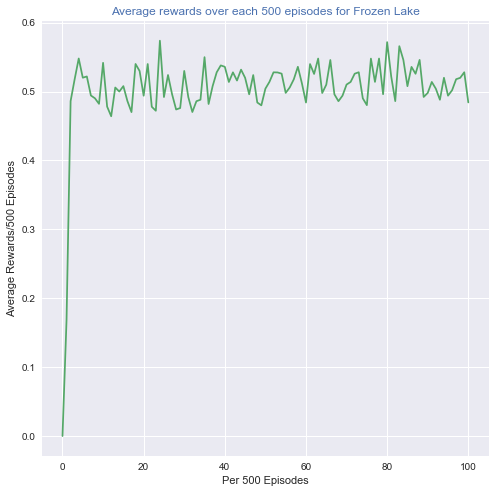

In [12]:
# Plot average rewards
mpl.style.use('seaborn')
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_title('Average rewards over each 500 episodes for Frozen Lake'.format('seaborn'), color='C0')
ax.set_ylabel('Average Rewards/500 Episodes')
ax.set_xlabel('Per 500 Episodes') 
#ax.set_ylim([-2,2])    
ax.plot(rewardLambda['Score'], 'C'+str(1))

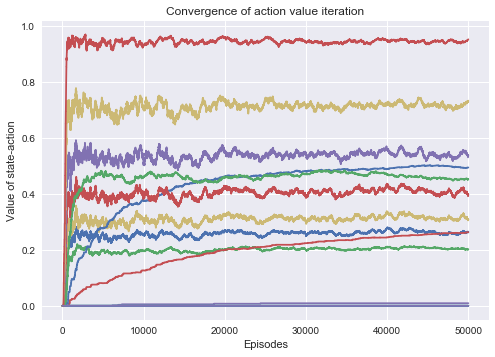

In [13]:
# max(Q(s, a)) over actions for each state in each episode
plt.title('Convergence of action value iteration')
plt.xlabel('Episodes')
plt.ylabel('Value of state-action')
plt.plot(rewardLambda['Js_Q'])
plt.show()

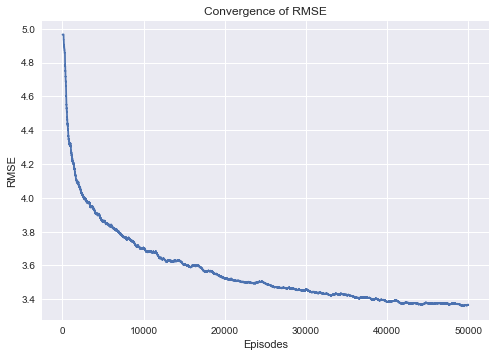

In [14]:
# RMSE: root of mean square error
plt.title('Convergence of RMSE')
plt.xlabel('Episodes')
plt.ylabel('RMSE')
plt.plot(rewardLambda['RMSE'])
plt.show()

In [15]:
def plot_policy(env, Js, mus):  
    n = len(Js)
    every = int(np.floor(n/10))
    for (J, mu) in zip(Js[(every-1):n:every], mus[(every-1):n:every]):
        plt.figure(figsize=(3,3))
        plt.imshow(J.reshape(4,4), cmap='gray', interpolation='none', clim=(0,1))
        ax = plt.gca()
        ax.set_xticks(np.arange(4)-.5)
        ax.set_yticks(np.arange(4)-.5)
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        Y, X = np.mgrid[0:4, 0:4]
        a2uv = {0: (-1, 0), 1:(0, -1), 2:(1,0), 3:(-1, 0)}
        Mu = mu.reshape(4,4)
        for y in range(4):
            for x in range(4):
                a = Mu[y, x]
                u, v = a2uv[a]
                plt.arrow(x, y,u*.3, -v*.3, color='m', head_width=0.1, head_length=0.1) 
                plt.text(x, y, str(env.desc[y,x].item().decode()),
                         color='g', size=12,  verticalalignment='center',
                         horizontalalignment='center', fontweight='bold')
        plt.grid(color='b', lw=2, ls='-')

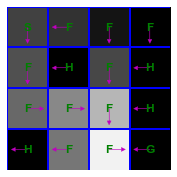

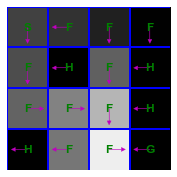

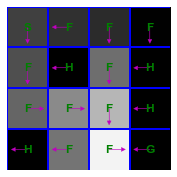

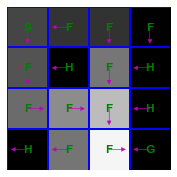

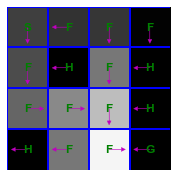

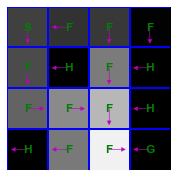

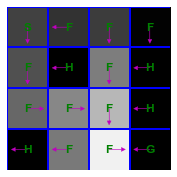

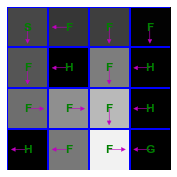

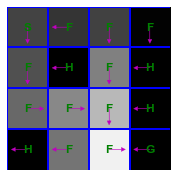

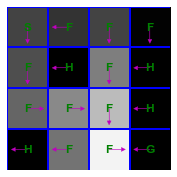

In [16]:
plot_policy(env, rewardLambda['Js_Q'], rewardLambda['mus'])

In [17]:
lambda_ = np.arange(0, 1.2, 0.2)
alpha_ = np.arange(0.1, 1, 0.2)
RMSE_first5000 = np.zeros((len(alpha_), len(lambda_)))
for i in np.arange(0, len(alpha_)):
    for j in np.arange(0, len(lambda_)):    
        rewardLambda = SarsaLambdaETrace(mdp, nEp=3000, nStep=100, epi=0.05, gamma=0.9, alpha=alpha_[i], Lambda=lambda_[j], stepExponent=0)
        RMSE = rewardLambda['RMSE']
        RMSE_first5000[i][j] = np.mean(RMSE)

Episode 0 finished after 11 timesteps getting -0.010000000000000002 rewards
Episode 1 finished after 4 timesteps getting -0.003 rewards
Episode 2 finished after 8 timesteps getting -0.007 rewards
Episode 3 finished after 2 timesteps getting -0.001 rewards
Episode 4 finished after 2 timesteps getting -0.001 rewards
Episode 5 finished after 2 timesteps getting -0.001 rewards
Episode 6 finished after 9 timesteps getting -0.008 rewards
Episode 7 finished after 5 timesteps getting -0.004 rewards
Episode 8 finished after 9 timesteps getting -0.008 rewards
Episode 9 finished after 4 timesteps getting -0.003 rewards
Episode 10 finished after 2 timesteps getting -0.001 rewards
Episode 11 finished after 5 timesteps getting -0.004 rewards
Episode 12 finished after 2 timesteps getting -0.001 rewards
Episode 13 finished after 2 timesteps getting -0.001 rewards
Episode 14 finished after 7 timesteps getting -0.006 rewards
Episode 15 finished after 4 timesteps getting -0.003 rewards
Episode 16 finishe

# Different parameters 

In [75]:
nEp = 20000
lambda_ = [0, 0.3, 0.6, 1]
RMSE = np.zeros((len(lambda_), nEp))
AveReward = np.zeros((len(lambda_), nEp/500+1))
for j in np.arange(0, len(lambda_)):    
    rewardLambda = SarsaLambdaETrace(mdp, nEp=nEp, nStep=100, epi=0.05, gamma=0.9, alpha=0.5, Lambda=lambda_[j])
    RMSE[j,:] = rewardLambda['RMSE']
    AveReward[j,:] = rewardLambda['Score']

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Episode 0 finished after 7 timesteps getting -0.006 rewards
Episode 1 finished after 2 timesteps getting -0.001 rewards
Episode 2 finished after 24 timesteps getting -0.023000000000000013 rewards
Episode 3 finished after 3 timesteps getting -0.002 rewards
Episode 4 finished after 5 timesteps getting -0.004 rewards
Episode 5 finished after 11 timesteps getting -0.010000000000000002 rewards
Episode 6 finished after 2 timesteps getting -0.001 rewards
Episode 7 finished after 2 timesteps getting -0.001 rewards
Episode 8 finished after 4 timesteps getting -0.003 rewards
Episode 9 finished after 2 timesteps getting -0.001 rewards
Episode 10 finished after 2 timesteps getting -0.001 rewards
Episode 11 finished after 7 timesteps getting -0.006 rewards
Episode 12 finished after 4 timesteps getting -0.003 rewards
Episode 13 finished after 2 timesteps getting -0.001 rewards
Episode 14 finished after 3 timesteps getting -0.002 rewards
Episode 15 finished after 2 timesteps getting -0.001 rewards
Ep

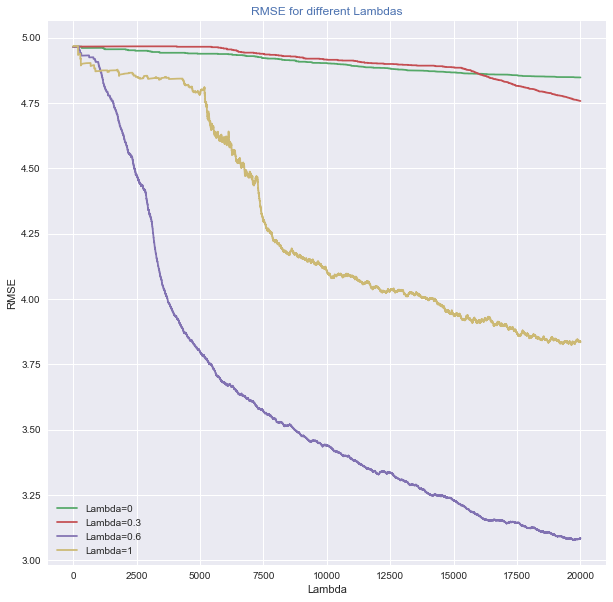

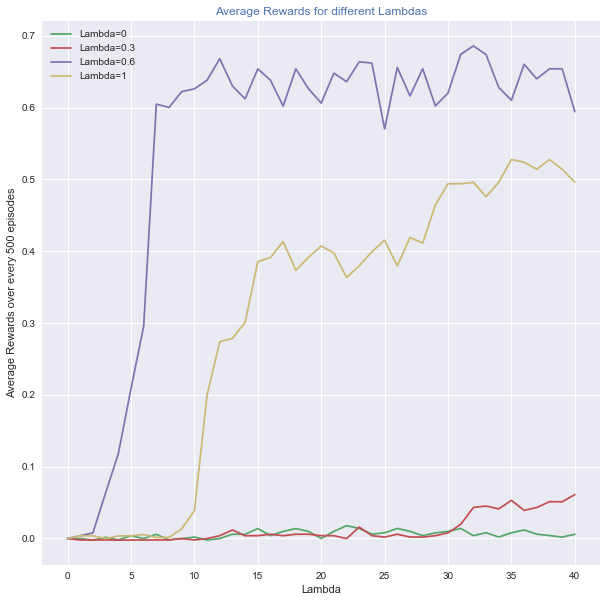

In [76]:
mpl.style.use('seaborn')
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title('RMSE for different Lambdas'.format('seaborn'), color='C0')
ax.set_ylabel('RMSE')
ax.set_xlabel('Lambda') 
#ax.set_xlim([0,1])
 #ax.plot(RMSE_first5000[:,i], 'C'+str(i+1), label='Lambda='+str(lambda_[i]))
for i in range(len(lambda_)):
    ax.plot(RMSE[i,:], 'C'+str(i+1), label='Lambda='+str(lambda_[i])) 
ax.legend() 
mpl.style.use('seaborn')
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title('Average Rewards for different Lambdas'.format('seaborn'), color='C0')
ax.set_ylabel('Average Rewards over every 500 episodes')
ax.set_xlabel('Lambda') 
#ax.set_xlim([0,1])
 #ax.plot(RMSE_first5000[:,i], 'C'+str(i+1), label='Lambda='+str(lambda_[i]))
for i in range(len(lambda_)):
    ax.plot(AveReward[i,:], 'C'+str(i+1), label='Lambda='+str(lambda_[i])) 
ax.legend() 

We plot the RMSE for different $\lambda's$ and different fixed stepsizes below.

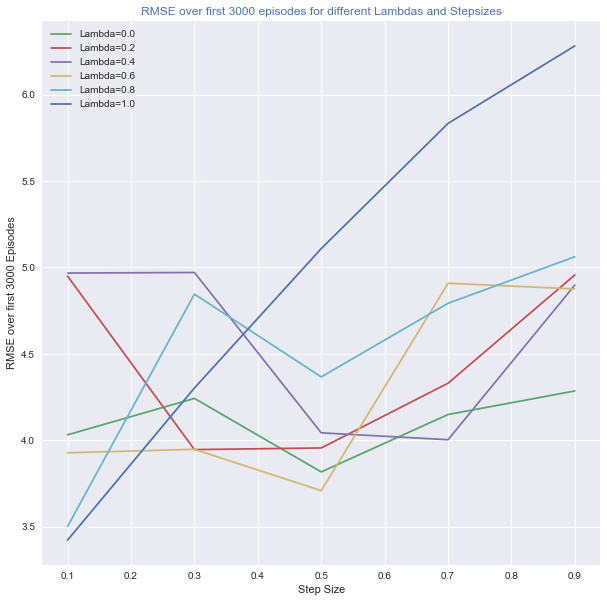

In [50]:
mpl.style.use('seaborn')
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title('RMSE over first 3000 episodes for different Lambdas and Stepsizes'.format('seaborn'), color='C0')
ax.set_ylabel('RMSE over first 3000 Episodes')
ax.set_xlabel('Step Size') 
#ax.set_xlim([0,1])
 #ax.plot(RMSE_first5000[:,i], 'C'+str(i+1), label='Lambda='+str(lambda_[i]))
for i in range(len(lambda_)):
    ax.plot(alpha_, RMSE_first5000[:,i], 'C'+str(i+1), label='Lambda='+str(lambda_[i])) 
ax.legend() 